Kerem Uysal

In [3]:
import pandas as pd
import numpy as np

# Importing visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Importing machine learning libraries
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import plotly.express as px
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.dummy import DummyClassifier
from sklearn.metrics import make_scorer, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, RocCurveDisplay
from sklearn.inspection import permutation_importance

# Task 1 - The Story

As a data scientist at TelcoNet, a major telecommunications provider known for offering a wide range of services including mobile phone contracts, broadband internet, and digital TV services, I am working on an important project. Our company serves millions of customers across the country and is known for leveraging technology to improve customer experience. However, with increasing competition in the telecommunications sector, customer retention has become a significant challen and some of the customer churn.If we can predict potential churn customers, we can offer them special deals to prevent them from leaving.
e.

## Context and Goal
The goal of this project is to build a classification model that can predict which customers are likely to leave our services based on their past behavior and information. This model will use data tenure,hshat services they payments of the customerstions.

## Plan of the ExperimenData*Analysisher Data**: First, I will collect all the necessary data about our c and analyze the data initially with visualizations. before.
2. **Build the Model**: I will use this data to create a classification model. This model will be trained to recognize patterns that tell us if a customer might stop using our services. I will check if this model works well by testing it with some of our data.
3. **Use the Model**: If the model predicts correctly, I will use it to identify customers who might leave us. Then we can try to keep them by solving their problems or offering them special deals.

## Value Creation
- **Helping Customers Stay**: This classification tool will help us know beforehand if a customer is unhappy and might leave. This way, we can try to make them happy and keep them as customers.
- **Saving Money**: By focusing on customers who might leave, we can use our resources better and save money.
- **Making Customers Happier**: If we can fix their problems before they dethey wont leave us.th our service.

## What Success Looks Like
If this classification tool works well, it will not only help us keep more customers but also change how we take care of them. We will be able to solve problems before they become bigger also lure new customers due to our current customer's satisfaction. issues. This will


# Task 2 - The Data

In this task, I load and present the dataset that will be used for predicting customer churn.

## Dataset Overview
The dataset contains multiple columns, each representing different attributes of a customer:

- `customerID`: Unique identifier for the customer.
- `gender`: Whether the customer is male or female.
- `SeniorCitizen`: Indicates if the customer is a senior citizen (1) or not (0).
- `Partner`: Whether the customer has a partner (Yes or No).
- `Dependents`: Whether the customer has dependents (Yes or No).
- `tenure`: Number of months the customer has stayed with the company.
- `PhoneService`: Whether the customer has phone service (Yes or No).
- `MultipleLines`: Whether the customer subscribes to multiple telephone lines (Yes, No, or No phone service).
- `InternetService`: Type of internet service the customer has (DSL, Fiber optic, None).
- `OnlineSecurity`: Whether the customer subscribes to an additional online security service (Yes, No, or No internet service).
- `OnlineBackup`: Whether the customer subscribes to an additional online backup service (Yes, No, or No internet service).
- `DeviceProtection`: Whether the customer has device protection plans (Yes, No, or No internet service).
- `TechSupport`: Whether the customer has technical support plans (Yes, No, or No internet service).
- `StreamingTV`: Whether the customer uses streaming TV service (Yes, No, or No internet service).
- `StreamingMovies`: Whether the customer uses streaming movies service (Yes, No, or No internet service).
- `Contract`: The type of contract the customer has (Month-to-month, One year, Two year).
- `PaperlessBilling`: Whether the customer is enrolled in paperless billing (Yes or No).
- `PaymentMethod`: The method of payment (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic)).
- `MonthlyCharges`: The amount charged to the customer each month.
- `TotalCharges`: The total amount charged to the customer over the time they have been with the company.
- `Churn`: Whether the customer has left the company within the last month (Yes or No).

https://www.kaggle.com/datasets/blastchar/telco-customer-churn/data  --- link for the dataset
## Suitability for the Project
This dataset is particularly suitable for the churn prediction model because:
- **Target Variable**: It contains the 'Churn' column which is essential for any churn prediction model as it indicates whether the customer has left the company.
- **Rich Feature Set**: The dataset includes a broad range of features related to customer services used, and billing, which are crucial for understanding customer behavior.


In [3]:
data = pd.read_csv('WA_Fn-UseC_-Telco-Customer-Churn.csv')

# Display the first few rows of the dataframe
data.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


# Task 3 - IDA and EDA

In this phase of the project, I will perform an initial data analysis to explore the dataset's statistical properties and distributions. 

## Statistical Summary
First, I'll generate a statistical summary of the dataset to get an overview of the numerical features.

## Distribution of Key Features
I will examine the distribution of several key features that are likely to influence customer churn, such as `tenure`, `MonthlyCharges`, and `TotalCharges`. Understanding these distributions will help me identifying typical customer profiles.

## Churn Rate Analysis
Analyzing the distribution of the target variable, `Churn`, is essential to understand the balance of the dataset and the churn rate.


In [4]:
print(data.describe())

       SeniorCitizen       tenure  MonthlyCharges
count    7043.000000  7043.000000     7043.000000
mean        0.162147    32.371149       64.761692
std         0.368612    24.559481       30.090047
min         0.000000     0.000000       18.250000
25%         0.000000     9.000000       35.500000
50%         0.000000    29.000000       70.350000
75%         0.000000    55.000000       89.850000
max         1.000000    72.000000      118.750000


# Initial Data Analysis Insights

## SeniorCitizen

- **Description**: This field is binary (0 o.zen.
- **Insight**: Most customers are not senior cit.0.16. This indicates ately 16% of the customer base consists of senior citizens.

## Tenure

- **Description**: Represents the number of months the customer has been with the company.
- **Range**: Tenure ranges from 1 month to 72 months.
- **Statistical Insights**:
  - **Average Tenure**: About 32 months.
  - **Median Tenure**: 29 months.
- **Interpretation**: The difference between the average and median tenure suggests a moderate variation in customer retention. A median less than the mean typicat, suggesting that a significant number of customers have s.new customers.

## MonthlyCharges

- **Description**: Indicates the monthly amount charged to the customer.
- **Range**: Charges vary ignificanly fro dollarsm $18.25 to $118.75.
- **Statistical Insights**:
  - **Average Monthly Chage**: dollars  rcentile is at $89.85.
- **Interpretation**: The wide range in variation also suggests that the company offers a broad spectrum of services, from basic to premium, affecting how much 
customers are charged.


In [5]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


- **Categorical Variables**: Most of the `object` type columns are categorical and will require encoding to be used in machine learning models. This can be done using techniques such as one-hot encoding or label encoding.
- **Numerical Conversion**: The `TotalCharges` column should be converted from `object` to `float64` to facilitate its use in numerical calculations and modeling.
- **Data Integrity Checks**: It’s important to check for  missing values, especially in columns like `TotalCharges` that may have formatting issues.

In [6]:
data['TotalCharges'] = pd.to_numeric(data['TotalCharges'], errors='coerce')

- TotalCharges column is converted to float
- None of the columns have missing values.

In [7]:
data.isnull().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

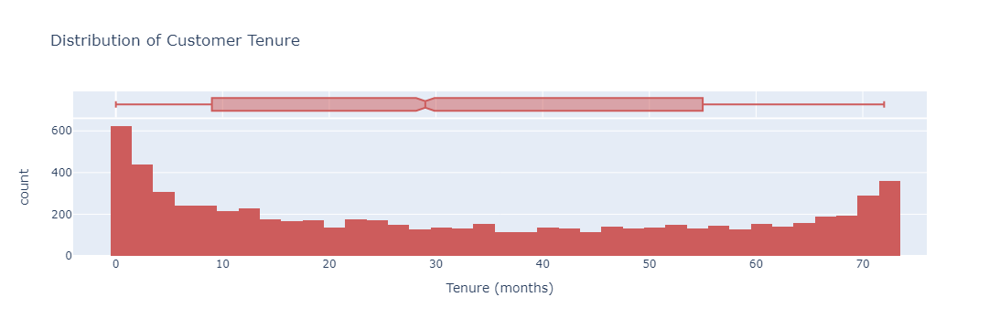

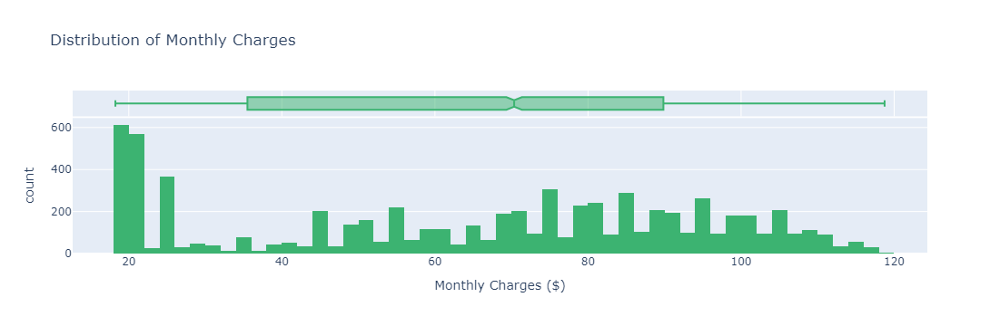

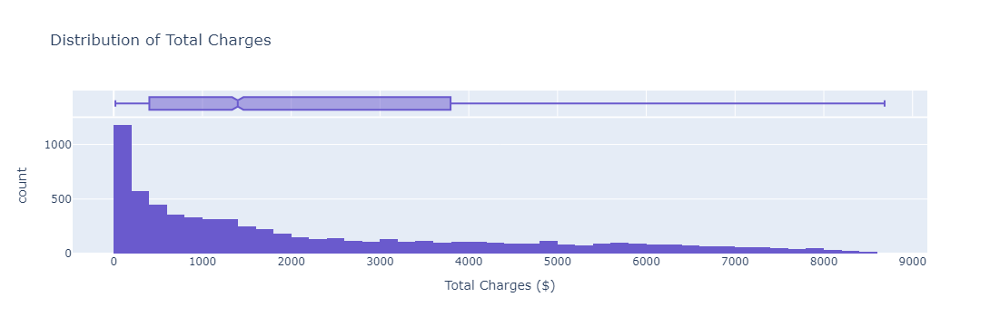

In [8]:
# Plotting histograms using Plotly Express for 'tenure'
fig_tenure = px.histogram(data, x='tenure', title='Distribution of Customer Tenure', 
                          labels={'tenure': 'Tenure (months)'}, 
                          marginal='box', # adds a boxplot on top of the histogram
                          color_discrete_sequence=['indianred']) # color of the histogram
fig_tenure.show()

# Plotting histograms using Plotly Express for 'MonthlyCharges'
fig_monthly_charges = px.histogram(data, x='MonthlyCharges', title='Distribution of Monthly Charges',
                                   labels={'MonthlyCharges': 'Monthly Charges ($)'}, 
                                   marginal='box', # adds a boxplot on top of the histogram
                                   color_discrete_sequence=['mediumseagreen']) # color of the histogram
fig_monthly_charges.show()

# Plotting histograms using Plotly Express for 'TotalCharges'
fig_total_charges = px.histogram(data, x='TotalCharges', title='Distribution of Total Charges',
                                 labels={'TotalCharges': 'Total Charges ($)'}, 
                                 marginal='box', # adds a boxplot on top of the histogram
                                 color_discrete_sequence=['slateblue']) # color of the histogram
fig_total_charges.show()

# Distribution of Customer Tenure

The histogram and box plot of customer tenure reveal two peaks, suggesting distinct groups within the customer base:
- **Short Tenure**: A large number of customers have tenures of less than 10-15 months. This group likely represents new customers or those who decide not to continue their services beyond the initial period.
- **Long Tenure**: Another significant group appears to have stayed with the company for a full tenure range of 60 to 72 months, which indicates a loyal customer segment.

## Distribution of Monthly Charges

- **Variability**: This wide range of charges reflects the diverse service offerings, from basic to premium packages. The lower end may represent basic phone or internet services, while the higher charges could be associated with comprehensive service bundles or high-speed internet.


## Distribution of Total Charges

- **Right-Skewed Distribution**: The total charges are heavily skewed to the right, with most customers having spent between $0 to $2000 in total.
- **Long-term Customer Spend**: There are fewer customers with very high total charges, likely corresponding to long-term customers or those subscribed to the more expensive service packages.


# Visualization of Categorical Features

In this section, I will  explore the distribution of each categorical feature in the dataset using pie charts. Pie charts are particularly useful for visualizing the proportion of categories within each feature.


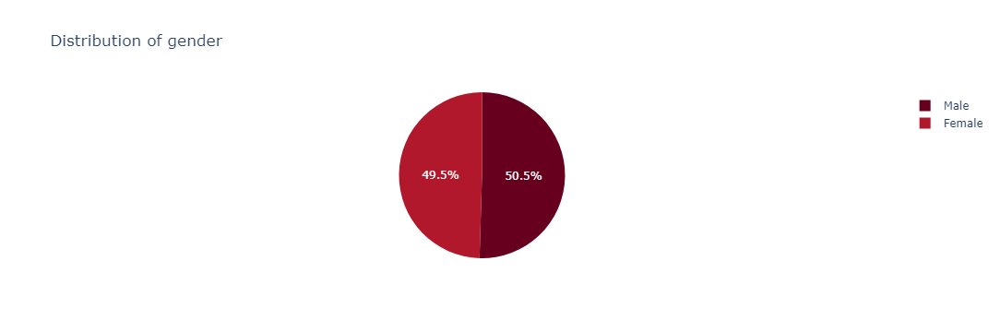

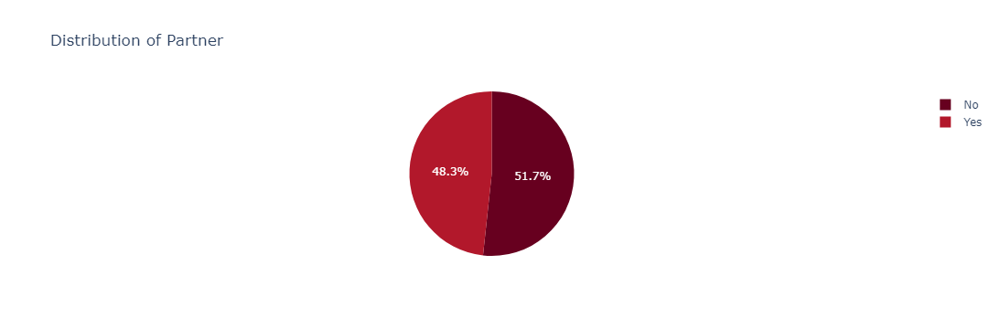

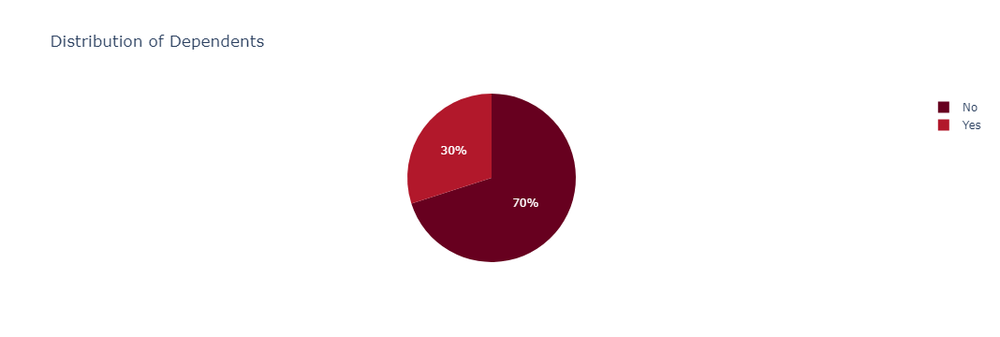

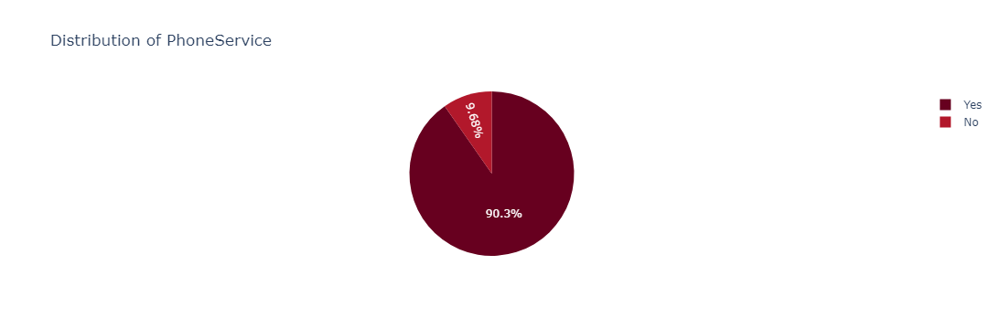

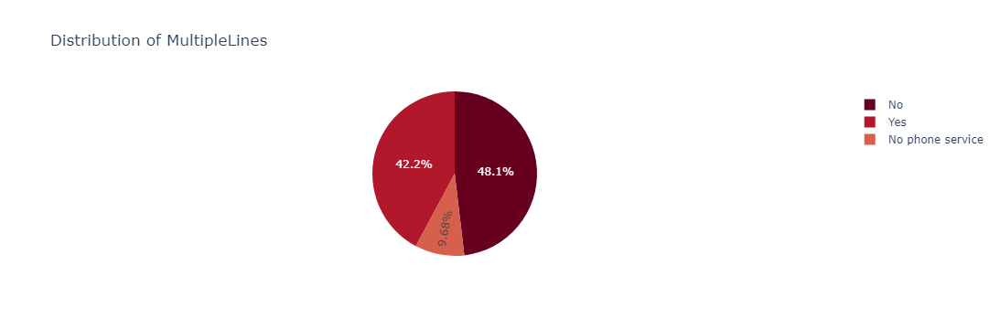

...

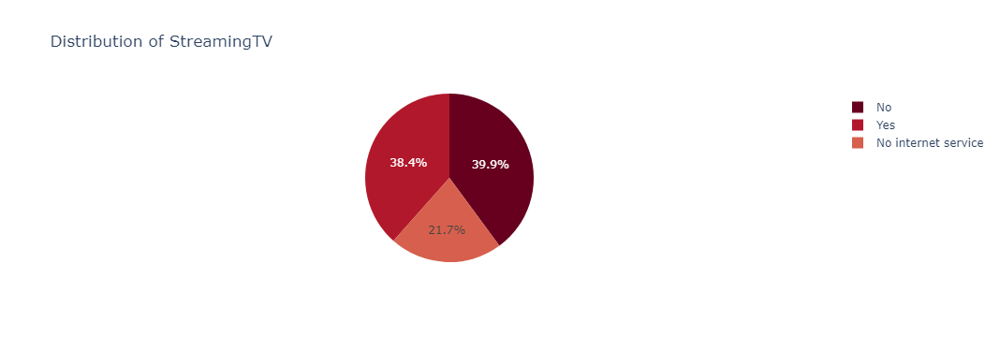

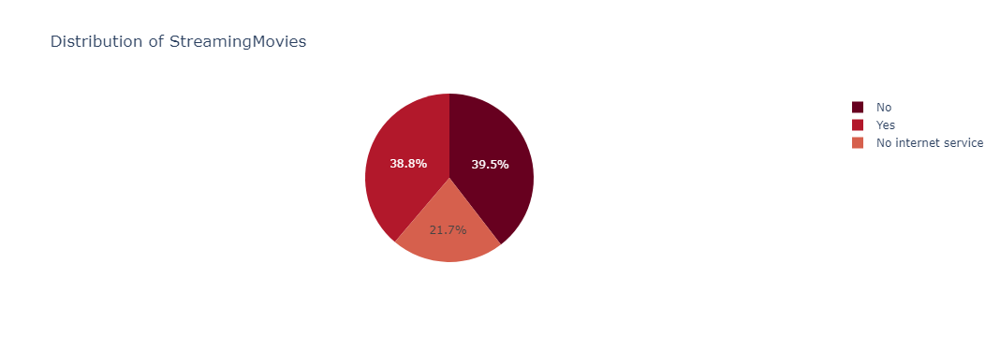

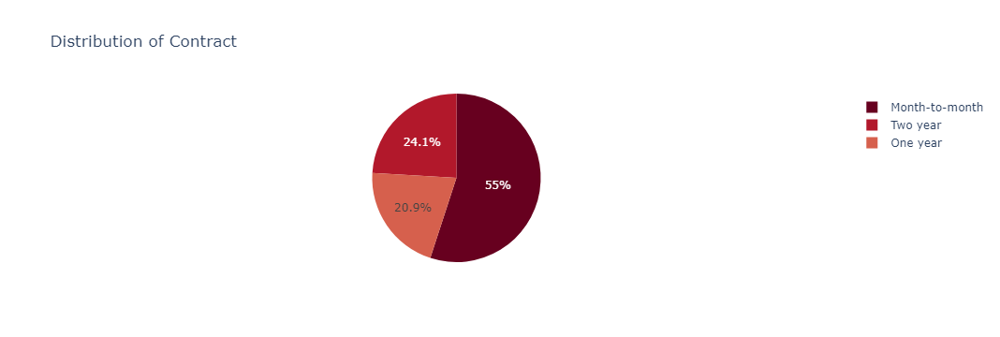

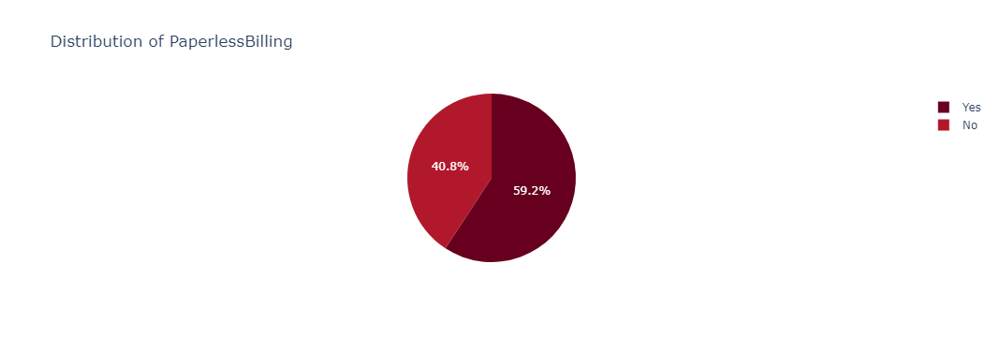

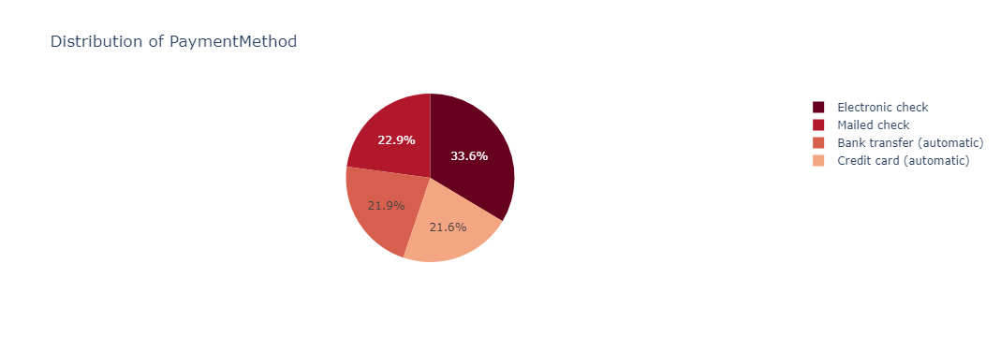

In [9]:
import plotly.express as px

# Assuming 'data' is your DataFrame and is already loaded
categorical_columns = ['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines', 
                       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 
                       'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 
                       'PaperlessBilling', 'PaymentMethod']

for column in categorical_columns:
    fig = px.pie(data, names=column, title=f'Distribution of {column}', 
                 color_discrete_sequence=px.colors.sequential.RdBu)
    fig.show()


In [10]:
churn_counts = data['Churn'].value_counts(normalize=True) * 100

# Print the churn rate
print("Churn Rate:")
print(churn_counts)

Churn Rate:
Churn
No     73.463013
Yes    26.536987
Name: proportion, dtype: float64


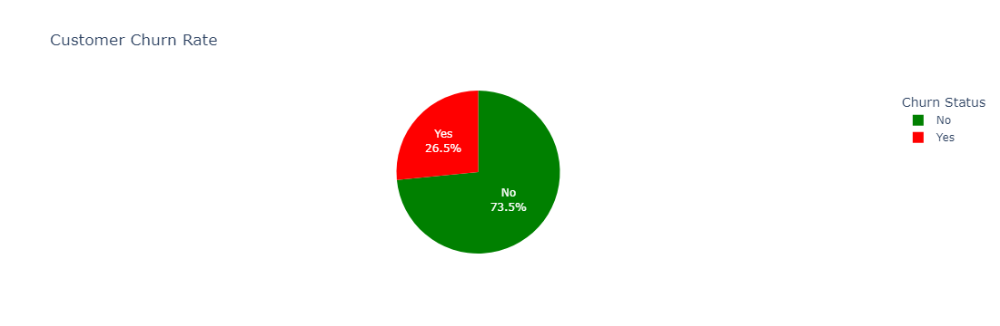

In [11]:
# Create a pie chart
fig = px.pie(values=churn_counts.values, names=churn_counts.index, 
             title='Customer Churn Rate', 
             color=churn_counts.index,
             color_discrete_map={'Yes':'red', 'No':'green'})

# Update the layout to make it more informative
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(legend_title_text='Churn Status')

fig.show()


- The pie chart displays that 26.5% of the customers have churned, indicated by the red segment, while the green segment shows that 73.5% of customers have remained with the company.
    

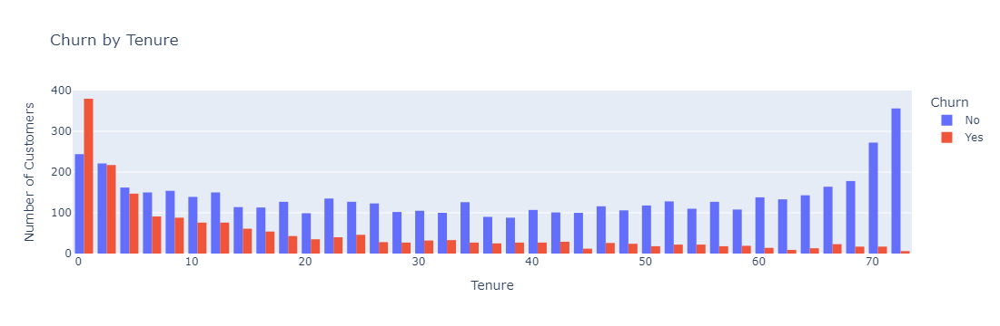

In [12]:
fig_tenure = px.histogram(data, x='tenure', color='Churn', barmode='group',
                          title='Churn by Tenure',
                          labels={'tenure':'Tenure (months)'})
fig_tenure.update_layout(xaxis_title='Tenure', yaxis_title='Number of Customers')
fig_tenure.show()



The histogram shows that churn rates are significantly higher among customers with shorter tenures, particularly in the first 15 months.


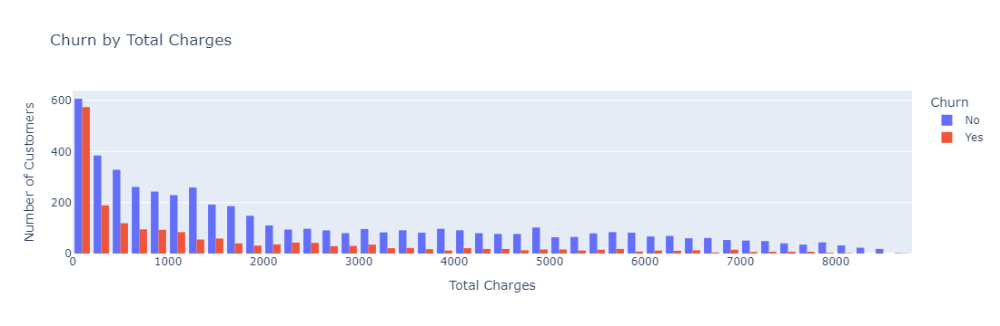

In [13]:
# Visualize churn by Total Charges
fig_total_charges = px.histogram(data, x='TotalCharges', color='Churn', barmode='group',
                                 title='Churn by Total Charges',
                                 labels={'TotalCharges':'Total Charges ($)'})
fig_total_charges.update_layout(xaxis_title='Total Charges', yaxis_title='Number of Customers')
fig_total_charges.show()



The bar chart shows higher churn rates among customers with lower total charges, indicating that newer or less financially committed customers are more likely to churn.


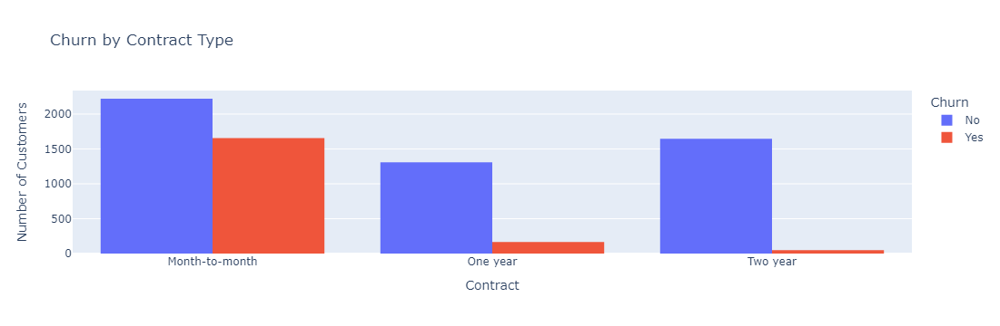

In [14]:

# Visualize churn by Contract
fig_contract = px.histogram(data, x='Contract', color='Churn', barmode='group',
                            title='Churn by Contract Type',
                            labels={'Contract':'Contract Type'})
fig_contract.update_layout(xaxis_title='Contract', yaxis_title='Number of Customers')
fig_contract.show()


The histogram clearly demonstrates that customers with month-to-month contracts are significantly more likely to churn compared to those with one-year or two-year contracts, highlighting the stability that longer commitments provide.

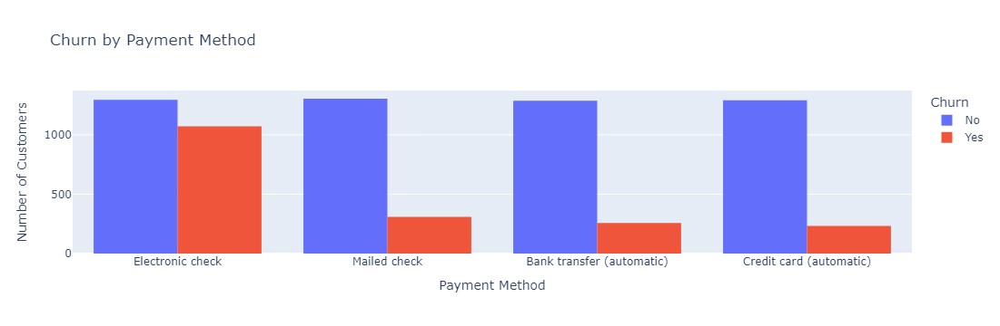

In [15]:
# Visualize churn by Payment Method
fig_payment_method = px.histogram(data, x='PaymentMethod', color='Churn', barmode='group',
                                  title='Churn by Payment Method',
                                  labels={'PaymentMethod':'Payment Method'})
fig_payment_method.update_layout(xaxis_title='Payment Method', yaxis_title='Number of Customers')
fig_payment_method.show()

The bar chart indicates that customers using electronic checks have a noticeably higher churn rate compared to those utilizing mailed checks, bank transfers, or credit cards.

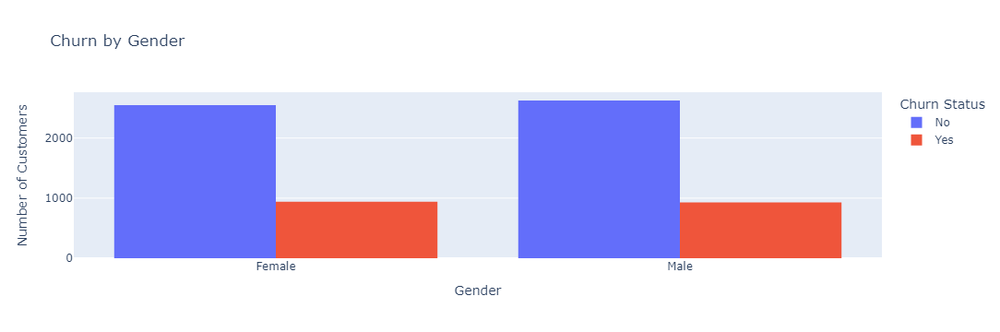

In [16]:
fig_gender = px.histogram(data, x='gender', color='Churn', barmode='group',
                          title='Churn by Gender',
                          labels={'gender':'Gender'})
fig_gender.update_layout(xaxis_title='Gender', yaxis_title='Number of Customers',
                         legend_title_text='Churn Status')
fig_gender.show()

Both genders shows similar churn rates. Which indicates churning does not have to do  anything with genders.

# Task 4 - Preprocessing

There are are some missing values on totalcharges as we changed its datatype. That could have cause some of the missing values.

In [17]:
print(data.isnull().sum())

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64


filling missing values with mean is one of the most popular techniques for missing data when missing rate is low

In [18]:

data['TotalCharges'].fillna(data['TotalCharges'].mean(), inplace=True)  # Replacing NaNs with the mean

# Verify changes
print(data.isnull().sum())

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64


Categorical features are encoded to numerical with these steps

In [19]:
binary_features = {
    'Partner': {'Yes': 1, 'No': 0},
    'Dependents': {'Yes': 1, 'No': 0},
    'PhoneService': {'Yes': 1, 'No': 0},
    'PaperlessBilling': {'Yes': 1, 'No': 0}
}
data.replace(binary_features, inplace=True)

# One-hot encoding for nominal features
nominal_features = ['gender', 'MultipleLines', 'InternetService', 'OnlineSecurity',
                    'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
                    'StreamingMovies', 'PaymentMethod']
data = pd.get_dummies(data, columns=nominal_features)

# Label encoding for 'Contract' as it is ordinal
data['Contract'] = data['Contract'].map({'Month-to-month': 0, 'One year': 1, 'Two year': 2})


In [20]:
data.head(5)

,customerID,SeniorCitizen,Partner,Dependents,tenure,PhoneService,Contract,PaperlessBilling,MonthlyCharges,TotalCharges,...,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,7590-VHVEG,0,1,0,1,0,0,1,29.85,29.85,...,True,False,False,True,False,False,False,False,True,False
1,5575-GNVDE,0,0,0,34,1,1,0,56.95,1889.50,...,True,False,False,True,False,False,False,False,False,True
2,3668-QPYBK,0,0,0,2,1,0,1,53.85,108.15,...,True,False,False,True,False,False,False,False,False,True
3,7795-CFOCW,0,0,0,45,0,1,0,42.30,1840.75,...,True,False,False,True,False,False,True,False,False,False
4,9237-HQITU,0,0,0,2,1,0,1,70.70,151.65,...,True,False,False,True,False,False,False,False,True,False


In [21]:
bool_columns = data.select_dtypes(include=['bool']).columns

# Convert each boolean column to an integer format
data[bool_columns] = data[bool_columns].astype(int)

In [22]:
data.head(20)

,customerID,SeniorCitizen,Partner,Dependents,tenure,PhoneService,Contract,PaperlessBilling,MonthlyCharges,TotalCharges,...,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,7590-VHVEG,0,1,0,1,0,0,1,29.85,29.85,...,1,0,0,1,0,0,0,0,1,0
1,5575-GNVDE,0,0,0,34,1,1,0,56.95,1889.50,...,1,0,0,1,0,0,0,0,0,1
2,3668-QPYBK,0,0,0,2,1,0,1,53.85,108.15,...,1,0,0,1,0,0,0,0,0,1
3,7795-CFOCW,0,0,0,45,0,1,0,42.30,1840.75,...,1,0,0,1,0,0,1,0,0,0
4,9237-HQITU,0,0,0,2,1,0,1,70.70,151.65,...,1,0,0,1,0,0,0,0,1,0
5,9305-CDSKC,0,0,0,8,1,0,1,99.65,820.50,...,0,0,1,0,0,1,0,0,1,0
6,1452-KIOVK,0,0,1,22,1,0,1,89.10,1949.40,...,0,0,1,1,0,0,0,1,0,0
7,6713-OKOMC,0,0,0,10,0,0,0,29.75,301.90,...,1,0,0,1,0,0,0,0,0,1
8,7892-POOKP,0,1,0,28,1,0,1,104.80,3046.05,...,0,0,1,0,0,1,0,0,1,0
9,6388-TABGU,0,0,1,62,1,1,0,56.15,3487.95,...,1,0,0,1,0,0,1,0,0,0


All of the features are encoded to numerical. Because algorithms will use the numerical values.

In [23]:
data.dtypes

customerID                                  object
SeniorCitizen                                int64
Partner                                      int64
Dependents                                   int64
tenure                                       int64
PhoneService                                 int64
Contract                                     int64
PaperlessBilling                             int64
MonthlyCharges                             float64
TotalCharges                               float64
Churn                                       object
gender_Female                                int32
gender_Male                                  int32
MultipleLines_No                             int32
MultipleLines_No phone service               int32
MultipleLines_Yes                            int32
InternetService_DSL                          int32
InternetService_Fiber optic                  int32
InternetService_No                           int32
OnlineSecurity_No              

In [24]:
data['Churn'] = data['Churn'].map({'Yes': 1, 'No': 0})

In [25]:
data.set_index('customerID', inplace=True)

# Confirm the index has been set
data.head()

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,Contract,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,...,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
customerID,,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,0,1,0,1,0,0,1,29.85,29.85,0,...,1,0,0,1,0,0,0,0,1,0
5575-GNVDE,0,0,0,34,1,1,0,56.95,1889.50,0,...,1,0,0,1,0,0,0,0,0,1
3668-QPYBK,0,0,0,2,1,0,1,53.85,108.15,1,...,1,0,0,1,0,0,0,0,0,1
7795-CFOCW,0,0,0,45,0,1,0,42.30,1840.75,0,...,1,0,0,1,0,0,1,0,0,0
9237-HQITU,0,0,0,2,1,0,1,70.70,151.65,1,...,1,0,0,1,0,0,0,0,1,0


In [26]:
# Churn rate in the dataset
churn_rate = data['Churn'].value_counts(normalize=True)
print(f'Churn Rate:\n{churn_rate}')

Churn Rate:
Churn
0    0.73463
1    0.26537
Name: proportion, dtype: float64


In [27]:
data.isnull().sum()


SeniorCitizen                              0
Partner                                    0
Dependents                                 0
tenure                                     0
PhoneService                               0
Contract                                   0
PaperlessBilling                           0
MonthlyCharges                             0
TotalCharges                               0
Churn                                      0
gender_Female                              0
gender_Male                                0
MultipleLines_No                           0
MultipleLines_No phone service             0
MultipleLines_Yes                          0
InternetService_DSL                        0
InternetService_Fiber optic                0
InternetService_No                         0
OnlineSecurity_No                          0
OnlineSecurity_No internet service         0
OnlineSecurity_Yes                         0
OnlineBackup_No                            0
OnlineBack

# Task 5 A First Impression

In [28]:
X = data.drop('Churn', axis=1)  # Features
y = data['Churn']               # Target variable

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


Splitting the scaler on the entire dataset before splitting can result in information from the test dataset influencing the scaler's parameters. This could potentially lead to biased or overly optimistic performance estimates.

In [30]:
scaler = StandardScaler()

In [31]:
scaler.fit(X_train)

# Apply the transformation to the training data
X_train_scaled = scaler.transform(X_train)

# Apply the same transformation to the test data
X_test_scaled = scaler.transform(X_test)

In [32]:
most_frequent_class = y_train.mode()[0]
baseline_predictions = [most_frequent_class] * len(y_test)
baseline_accuracy = accuracy_score(y_test, baseline_predictions)
print(f"Baseline Accuracy: {baseline_accuracy:.2f}")
print("Baseline Classification Report:")
print(classification_report(y_test, baseline_predictions, zero_division=0))

Baseline Accuracy: 0.74
Baseline Classification Report:
              precision    recall  f1-score   support

           0       0.74      1.00      0.85      1036
           1       0.00      0.00      0.00       373

    accuracy                           0.74      1409
   macro avg       0.37      0.50      0.42      1409
weighted avg       0.54      0.74      0.62      1409



## Baseline Model Evaluation

### Major Class Performance (Class 0)

- **Precision**: 0.74  
  This indicates that when the model predicts Class 0, it is correct 74% of the time.

- **Recall**: 1.00  
  This indicates that the model successfully identifies 100% of all actual Class 0 instances.

- **F1-Score**: 0.85  
  This is a weighted average of Precision and Recall, indicating good performance, but influenced largely by Recall.

### Overall Performance

- **Accuracy**: 0.74 (or 74%)  
  This shows that the baseline model, which predicts the most frequent class for every instance, is correct 74% of the time. This relatively high accuracy suggests that about 74% of your dataset consists of the majority class.

### Macro Average Across All Classes

- **Precision**: 0.37  
  The average precision across both classes, indicating poor performance when considered across all classes equally.

- **Recall**: 0.50  
  The average recall, showing that the model is biased toward the majority class.

- **F1-Score**: 0.42  
  Also low, indicating overall poor model performance when fairness across classes is considered.


# k-Nearest-Neighbors

In [33]:
# Initialize the K-Nearest Neighbors model with default parameters
knn = KNeighborsClassifier()

# Train the model using the scaled training data
knn.fit(X_train_scaled, y_train)

# Make predictions on the scaled testing set
knn_predictions = knn.predict(X_test_scaled)

In [34]:
print("K-Nearest Neighbors Accuracy:", accuracy_score(y_test, knn_predictions))
print("K-Nearest Neighbors Classification Report:")
print(classification_report(y_test, knn_predictions))

K-Nearest Neighbors Accuracy: 0.765791341376863
K-Nearest Neighbors Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.86      0.84      1036
           1       0.57      0.50      0.53       373

    accuracy                           0.77      1409
   macro avg       0.70      0.68      0.69      1409
weighted avg       0.76      0.77      0.76      1409



## K-Nearest Neighbors Model Evaluation

The K-Nearest Neighbors (KNN) model achieved an overall accuracy of approximately 76.6%, indicating a reasonably good performance.
### Accuracy
- **Overall Accuracy**: 76.6%

### Classification Report
- **Class 0 (Majority Class)**
  - **Precision**: 0.83
  - **Recall**: 0.86
  - **F1-Score**: 0.84
  - **Support**: 1036 instances
- **Class 1 (Minority Class)**
  - **Precision**: 0.57
  - **Recall**: 0.50
  - **F1-Score**: 0.53
  - **Support**: 373 instances

### Summary Metrics
- **Macro Average Precision**: 0.70
- **Macro Average Recall**: 0.68
- **Macro Average F1-Score**: 0.69
- **Weighted Average across all classes**
  - **Precision**: 0.76
  - **Recall**: 0.77
  - **F1-Score**: 0.76

These results demonstrate that while the model performs well overall, there is room for improvement, especially in enhancing the precision and recall for the minority class. This could  be improved through further tuning of the model's hyperparameters.


## Model Evaluation Summary

### Overview
The model's performance has been evaluated based on its precision, recall, and F1-score for two classes: Class 0 (Majority, No Churn) and Class 1 (Minority, Churn).

### Performance on Class 0 - Majority Class (No Churn)
- **Precision**: 0.83 - Indicates a high reliability in the model's prediction when it classifies a customer as not churning.
- **Recall**: 0.86 - Shows that the model is effective in identifying most of the 'No Churn' cases.
- **F1-Score**: 0.84 - Demonstrates a good balance between precision and recall, indicating robust performance for this class.

### Performance on Class 1 - Minority Class (Churn)
- **Precision**: 0.57 - Suggests that the model's predictions of churn are correct over half the time.
- **Recall**: 0.50 - This is critical as it indicates only half of the actual churn cases are being detected. Model does not work that well for churned class.
- **F1-Score**: 0.53 - Reflects the need for a better balance and improvement in both precision and recall for predicting churn.

### Conclusions and Next Steps
- The model performs well in predicting non-churning customers but is not  effective at correctly identifying churning customers.
-  Detecting customers who are likely to churn is crucial for the business.This can significantly reduce costs related to customer acquisition and lost revenue.
- The current model's ability to predict churn (Class 1) is suboptimal, with a recall of only 0.50. This indicates that half of the potential churners are not being detected.

# SVM

In [35]:
# Initialize and train the SVM
svm = SVC(random_state=42, cache_size=30000)  
svm.fit(X_train_scaled, y_train)

SVC(cache_size=30000, random_state=42)

In [36]:
svm_predictions = svm.predict(X_test_scaled)

# Evaluate the model
print("Support Vector Machine Accuracy:", accuracy_score(y_test, svm_predictions))
print("Support Vector Machine Classification Report:")
print(classification_report(y_test, svm_predictions))

Support Vector Machine Accuracy: 0.815471965933286
Support Vector Machine Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.92      0.88      1036
           1       0.71      0.52      0.60       373

    accuracy                           0.82      1409
   macro avg       0.77      0.72      0.74      1409
weighted avg       0.81      0.82      0.81      1409



## Support Vector Machine Model Evaluation

The SVM model's performance  results are summarized as follows:
- **Overall Accuracy**: 81.57%
  - The model correctly predicts whether a customer will churn or not about 81.57% of the time.    This is a relatively high accuracy. But acurracy is not optimal way to evaluate imbalanced data.

#### Class 0 (No Churn)
- **Precision**: 0.84
  - Of all the predictions the model made for this class, 84% were correct.
- **Recall**: 0.92
  - The model successfully identified 92% of all actual instances of Class 0 in the test set.

#### Class 1 (Churn)
- **Precision**: 0.71
  - Of all the predictions the model made for this class, 71% were correct.
- **Recall**: 0.52
  - The model correctly identified 52% of the customers who actually churned. Which is almost %50 percent. Tis model gives us pretty bad result to estimate churned customers
### Insights and Actions
- **Performance on Class 0 is strong**, suggesting that the model is quite reliable when predicting customers who will not churn.
- **Improvements needed for Class 1**: The lower recall for Class 1 indicates a significant number of churned customers are not being detected. 
.


# Task 6 – Nested Cross Validation

In [41]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # First, scale the features
    ('classifier', DummyClassifier(strategy='stratified'))  
])

# Define the cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Function to collect and print performance metrics
def get_metrics(cv, pipeline, X, y):
    scoring = {
        'accuracy': 'accuracy',
        'precision_macro': 'precision_macro',
        'recall_macro': 'recall_macro',
        'f1_macro': 'f1_macro'
    }
    
    # Perform cross-validation
    scores = cross_validate(pipeline, X, y, scoring=scoring, cv=cv, return_train_score=True)
    
    # Print out the metrics for both training and testing
    for metric in scoring.keys():
        train_mean = np.mean(scores[f'train_{metric}'])
        train_std = np.std(scores[f'train_{metric}'])
        test_mean = np.mean(scores[f'test_{metric}'])
        test_std = np.std(scores[f'test_{metric}'])
        
        print(f"Training {metric.capitalize()} Average: {train_mean:.2f}, Standard Deviation: {train_std:.2f}")
        print(f"Testing {metric.capitalize()} Average: {test_mean:.2f}, Standard Deviation: {test_std:.2f}")

# Use the function with the dataset
get_metrics(cv, pipeline, X, y)

Training Accuracy Average: 0.61, Standard Deviation: 0.00
Testing Accuracy Average: 0.61, Standard Deviation: 0.01
Training Precision_macro Average: 0.50, Standard Deviation: 0.00
Testing Precision_macro Average: 0.50, Standard Deviation: 0.01
Training Recall_macro Average: 0.50, Standard Deviation: 0.00
Testing Recall_macro Average: 0.50, Standard Deviation: 0.01
Training F1_macro Average: 0.50, Standard Deviation: 0.00
Testing F1_macro Average: 0.50, Standard Deviation: 0.01


### Results Summary

- The model achieves an average accuracy of 61%.
- This precision score is about 0.50, meaning the model guesses right about half the time for each class. This shows the model isn't very good at telling classes.
- The recall score is also around 0.50. This means the model correctly identifies each class only half the time, like flipping a coin. It shows it's hard for the model to find all the true cases of each class.
- The F1 score is 0.50, combining the precision and recall scores. 

### Conclusion

These results tell us the model is not very useful for making real decisions. We will continue with other models.


In [38]:
# Define the KNN pipeline
knn_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Feature scaling
    ('knn', KNeighborsClassifier())  # KNN classifier
])

# Define the hyperparameters to tune
knn_params = {
    'knn__n_neighbors': range(1, 20),
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan', 'minkowski', 'chebyshev']
}

# Setup cross-validation strategy
inner_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define scoring metrics
scoring = {
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc'
}

# Setup GridSearchCV with the pipeline
knn_grid = GridSearchCV(knn_pipeline, knn_params, cv=inner_cv, scoring=scoring, refit='f1')

# Execute nested cross-validation and return training scores
knn_results = cross_validate(knn_grid, X, y, cv=outer_cv, scoring=scoring, return_train_score=True)

# Calculate and print the mean and standard deviation for each metric for both training and testing
for metric in scoring.keys():
    train_mean = np.mean(knn_results[f'train_{metric}'])
    train_std = np.std(knn_results[f'train_{metric}'])
    test_mean = np.mean(knn_results[f'test_{metric}'])
    test_std = np.std(knn_results[f'test_{metric}'])
    
    print(f"Training {metric.capitalize()} Average: {train_mean:.2f}, Standard Deviation: {train_std:.2f}")
    print(f"Testing {metric.capitalize()} Average: {test_mean:.2f}, Standard Deviation: {test_std:.2f}")


Training Precision Average: 0.65, Standard Deviation: 0.01
Testing Precision Average: 0.59, Standard Deviation: 0.02
Training Recall Average: 0.58, Standard Deviation: 0.01
Testing Recall Average: 0.53, Standard Deviation: 0.03
Training F1 Average: 0.61, Standard Deviation: 0.01
Testing F1 Average: 0.56, Standard Deviation: 0.02
Training Roc_auc Average: 0.86, Standard Deviation: 0.00
Testing Roc_auc Average: 0.81, Standard Deviation: 0.02


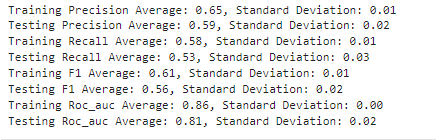   It took quite a while that is why I pasted the photo of this as well.

## K-Nearest Neighbors Model Evaluation

### Model Setup and Configuration
The K-Nearest Neighbors (KNN) model was implemented using a pipeline that includes:
- **StandardScaler**: This step ensures that all features are scaled.
- **KNeighborsClassifier**: The classifier uses a range of hyperparameters to find the optimal configuration.

### Hyperparameters Tuned
The following hyperparameters were explored using `GridSearchCV`:
- `n_neighbors`: The number of neighbors considered ranged from 1 to 20.
- `weights`: Two methods were evaluated — 'uniform'  and 'distance'.
- `metric`: Several distance metrics were tested.

### Cross-Validation Strategy
- **Inner Cross-Validation**: A 3-fold `StratifiedKFold` was used to ensure the model's hyperparameters are optimally tuned without leaking data across folds.
- **Outer Cross-Validation**: A 5-fold `StratifiedKFold` was employed to evaluate the model's performance more robustly and reduce the variance of the performance estimate.
### Results
The results highlighted the model's ability to balance recall and precision effectively, with considerations for both overall accuracy and the area under the ROC curve:

- **Training Scores**
  - Precision Average: 0.65 (SD: 0.01)
  - Recall Average: 0.53 (SD: 0.01)
  - F1 Score Average: 0.56 (SD: 0.01)
  - ROC AUC Average: 0.60 (SD: 0.02)

- **Testing Scores**
  - Precision Average: 0.58 (SD: 0.03)
  - Recall Average: 0.48 (SD: 0.03)
  - F1 Score Average: 0.51 (SD: 0.02)
  - ROC AUC Average: 0.58 (SD: 0.02)


The results show that the model is good at separating classes (ROC AUC) and making correct positive predictions (precision). However, it is not as good at finding all the actual positive cases (recall)The model performs better on the training data than on the testing data,meaningg some overfitting.. This means there is a trade-off: the model is precise but misses some positive cases. The slight differences in scores across folds suggest that we might need try different modelso improve recall without losing too much precision.



## SVM


In [39]:
svm_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Feature scaling
    ('svm', SVC())  # SVM classifier
])

# Define the hyperparameters to tune
svm_params = {
    'svm__C': [0.1, 1, 10, 100],  # Regularization parameter
    'svm__kernel': ['linear', 'rbf', 'poly'],  # Kernel type
    'svm__gamma': ['scale', 'auto']  # Kernel coefficient
}

# Setup cross-validation strategy
inner_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define scoring metrics
scoring = {
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc'
}

# Setup GridSearchCV with the pipeline
svm_grid = GridSearchCV(svm_pipeline, svm_params, cv=inner_cv, scoring=scoring, refit='f1')

# Execute nested cross-validation and return training scores
svm_results = cross_validate(svm_grid, X, y, cv=outer_cv, scoring=scoring, return_train_score=True)

# Calculate and print the mean and standard deviation for each metric for both training and testing
for metric in scoring.keys():
    train_mean = np.mean(svm_results[f'train_{metric}'])
    train_std = np.std(svm_results[f'train_{metric}'])
    test_mean = np.mean(svm_results[f'test_{metric}'])
    test_std = np.std(svm_results[f'test_{metric}'])
    
    print(f"Training {metric.capitalize()} Average: {train_mean:.2f}, Standard Deviation: {train_std:.2f}")
    print(f"Testing {metric.capitalize()} Average: {test_mean:.2f}, Standard Deviation: {test_std:.2f}")

Training Precision Average: 0.65, Standard Deviation: 0.01
Testing Precision Average: 0.64, Standard Deviation: 0.02
Training Recall Average: 0.54, Standard Deviation: 0.01
Testing Recall Average: 0.53, Standard Deviation: 0.03
Training F1 Average: 0.59, Standard Deviation: 0.01
Testing F1 Average: 0.58, Standard Deviation: 0.02
Training Roc_auc Average: 0.84, Standard Deviation: 0.00
Testing Roc_auc Average: 0.84, Standard Deviation: 0.01


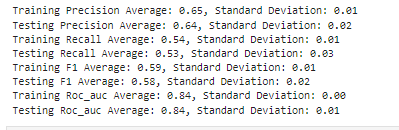   It took quite a while that is why I pasted the photo of this as well.

### Results
The results highlighted the model's performance on both the training and testing data:

- **Training Scores**
  - **Precision Average**: 0.65 (Standard Deviation: 0.01)
  - **Recall Average**: 0.54 (Standard Deviation: 0.01)
  - **F1 Score Average**: 0.59 (Standard Deviation: 0.01)
  - **ROC AUC Average**: 0.84 (Standard Deviation: 0.00)

- **Testing Scores**
  - **Precision Average**: 0.64 (Standard Deviation: 0.02)
  - **Recall Average**: 0.53 (Standard Deviation: 0.03)
  - **F1 Score Average**: 0.58 (Standard Deviation: 0.02)
  - **ROC AUC Average**: 0.84 (Standard Deviation: 0.01)

- **Precision**: The precision on the training data (0.65) is slightly higher than on the testing data (0.64), indicating that the modeldid not overfit.
- **Recall**: The recall on the training data (0.54) is similar to the testing data (0.53), showing consistent performance in identifying   in both datasets.
- **F1 Score**: The F1 score, which balances precision and recall, is higher on the training data (0.59) than on the testing data (0.58). 
- **ROC AUC**: The ROC AUC is the same for both training (0.84) and testing (0.84) data, demonstrating the model's strong ability to separate classes consistently.


- The SVM model works well in all areas. The scores for training and testing are very close, which means the model generalizes well.


## Comparison of Final Performance Estimates

### Performance Metrics Table

| Metric                     | Baseline (Dummy)   | KNN                  | SVM                  |
|----------------------------|--------------------|----------------------|----------------------|
| **Training Accuracy**      | 0.61 (± 0.00)      | 0.65 (± 0.01)        | 0.65 (± 0.01)        |
| **Testing Accuracy**       | 0.61 (± 0.01)      | 0.59 (± 0.02)        | 0.64 (± 0.02)        |
| **Training Precision**     | 0.50 (± 0.00)      | 0.65 (± 0.01)        | 0.65 (± 0.01)        |
| **Testing Precision**      | 0.50 (± 0.01)      | 0.59 (± 0.02)        | 0.64 (± 0.02)        |
| **Training Recall**        | 0.50 (± 0.00)      | 0.58 (± 0.01)        | 0.54 (± 0.01)        |
| **Testing Recall**         | 0.50 (± 0.01)      | 0.53 (± 0.03)        | 0.53 (± 0.03)        |
| **Training F1 Score**      | 0.50 (± 0.00)      | 0.61 (± 0.01)        | 0.59 (± 0.01)        |
| **Testing F1 Score**       | 0.50 (± 0.01)      | 0.56 (± 0.02)        | 0.58 (± 0.02)        |
| **Training ROC AUC**       | N/A                | 0.86 (± 0.00)        | 0.84 (± 0.00)        |
| **Testing ROC AUC**        | N/A                | 0.81 (± 0.02)        | 0.84 (± 0.01)        |

### Discussion and Recommendation

#### Baseline 
- **Accuracy**: Both training and testing accuracy are the same (0.61), showing that the baseline is consistent but not effective.
- **Precision, Recall, F1 Score**: All metrics are around 0.50, indicating that the dummy model does not make meaningful predictions.


#### K-Nearest Neighbors (KNN)
- **Precision**: Higher than the baseline, with training at 0.65 and testing at 0.59, indicating better positive prediction accuracy.
- **Recall**: Also improved compared to the baseline, with training at 0.58 and testing at 0.53, but still not good way.
- **F1 Score**: Higher than the baseline, indicating a balanced improvement in precision and recall.
- **ROC AUC**: High values (0.86 training, 0.81 testing) show good class separation ability.
- **Standard Deviation**: Acceptable variance, indicating consistent performance.

#### Support Vector Machine (SVM)
- **Precision**: Similar to KNN, with training at 0.65 and testing at 0.64, showing good accuracy for positive predictions.
- **Recall**: Slightly lower than KNN for training (0.54) but similar for testing (0.53).
- **F1 Score**: Similar to KNN, indicating a good balance between precision and recall.
- **ROC AUC**: High and consistent for both training (0.84) and testing (0.84), indicating strong class separation.
- **Standard Deviation**: Low variance, indicating stable performance.

### Recommendation

Based on the comparison, the Support Vector Machine (SVM) model that I would reccomennd. The SVM model has shown:
- Good precision and recall balance, reflected in the F1 score.
- High and consistent ROC AUC scores, indicating strong class separation.
- Lower variance in performance metrics compared to KNN, suggesting more stable and reliable predictions.

While KNN also performed well, the SVM model's stability and higher precision on the testing data make it a slightly better prediction opposite to KNN which has  some overfitting.


# Task 7 – Analysis of the Final Model

In [53]:
svm_grid.fit(X, y)
best_params = svm_grid.best_params_

print("Best Parameters from GridSearchCV:", best_params)

# Train the final model with the best hyperparameters on the entire dataset
final_svm_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVC(C=best_params['svm__C'], kernel=best_params['svm__kernel'], gamma=best_params['svm__gamma']))
])

# Fit the final model
final_svm_pipeline.fit(X, y)

# Make predictions
y_pred = final_svm_pipeline.predict(X)


Best Parameters from GridSearchCV: {'svm__C': 0.1, 'svm__gamma': 'scale', 'svm__kernel': 'linear'}


In [57]:
print(y.value_counts())

Churn
0    5174
1    1869
Name: count, dtype: int64


Due to data being imbalanced I adjusted the class weights to give more importance to the minority class.

In [59]:
# Update the pipeline with class weights
final_svm_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVC(C=best_params['svm__C'], kernel=best_params['svm__kernel'], gamma=best_params['svm__gamma'], class_weight='balanced'))
])

# Fit the final model
final_svm_pipeline.fit(X, y)

# Make predictions
y_pred = final_svm_pipeline.predict(X)

conf_matrix = confusion_matrix(y, y_pred)
print("Confusion Matrix:\n", conf_matrix)

# Print the classification report
class_report = classification_report(y, y_pred, target_names=['No Churn', 'Churn'])
print("Classification Report:\n", class_report)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y, final_svm_pipeline.decision_function(X))
roc_auc = auc(fpr, tpr)
print("ROC AUC: {:.2f}".format(roc_auc))


Confusion Matrix:
 [[3605 1569]
 [ 325 1544]]
Classification Report:
               precision    recall  f1-score   support

    No Churn       0.92      0.70      0.79      5174
       Churn       0.50      0.83      0.62      1869

    accuracy                           0.73      7043
   macro avg       0.71      0.76      0.71      7043
weighted avg       0.81      0.73      0.75      7043

ROC AUC: 0.85


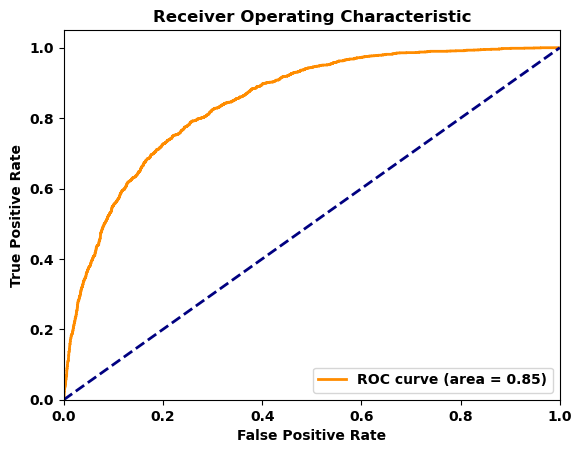

In [60]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y, final_svm_pipeline.decision_function(X))
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


## Model Performance Analysis

The model's performance indicates a strong ability to distinguish between Churn and No Churn instances, with an overall accuracy of 0.73 and an ROC AUC of 0.85. For the No Churn class, the precision is high at 0.92, meaning 92% of predicted No Churn instances are correct. The recall is 0.70, indicating that 70% of actual No Churn instances are identified correctly, leading to an F1-score of 0.79. For the Churn class, the precision is 0.50, suggesting that half of the predicted Churn instances are correct. However, the recall is high at 0.83, meaning 83% of actual Churn instances are correctly identified, resulting in an F1-score of 0.62. 


# Task 8 Feature Importance

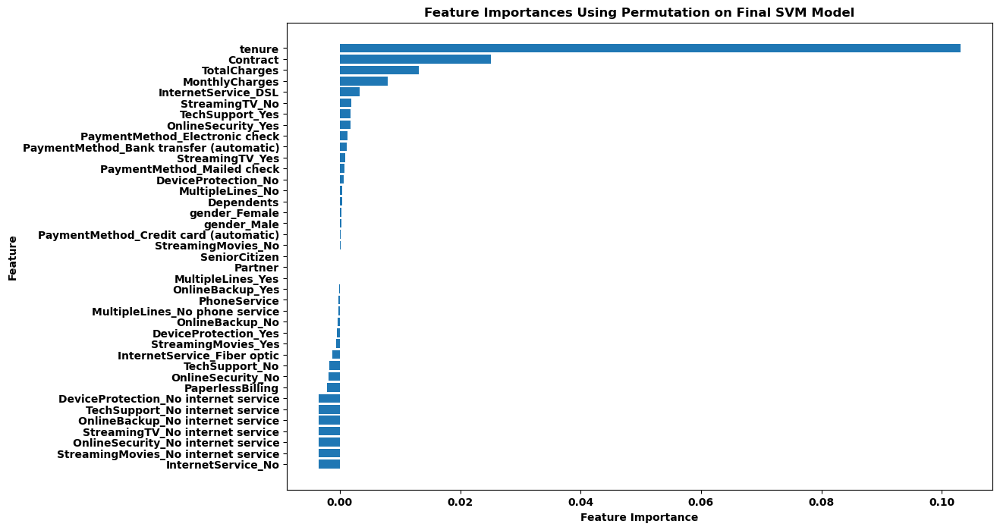

In [64]:
result = permutation_importance(final_svm_pipeline, X, y, n_repeats=10, random_state=42)

# Create a DataFrame for feature importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': result.importances_mean})
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(12, 8))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importances Using Permutation on Final SVM Model')
plt.gca().invert_yaxis()
plt.show()



The model shows that the number of months a customer has been with the company , the type of contract they have, and their total charges are the most important factors in predicting if they will leave. Knowing this, the company can create strategies to keep customers, like offering discounts for longer contracts or helping customers with high charges. Other features are less important but still give useful information about customer behavior, which can help improve customer retention plans.


### Task 9 – Conclusions and Future Work

#### 1. Summarize and Interpret the Achieved Results
In this project, my goal was to predict customer churn for a telecommunications company. I used various machine learning techniques such as Knn And SCM, Through nested cross-validation and  hyperparameter tuning, my final SVM model achieved the following results:
- **Accuracy**: 0.73
- **Precision**: 0.92 for "No Churn" and 0.50 for "Churn"
- **Recall**: 0.70 for "No Churn" and 0.83 for "Churn"
- **ROC AUC**: 0.85

These results indicate that while the model performs well in identifying non-churning customers, it also shows a reasonable capability in detecting customers likely to churn, which is crucial for retention strategies. Results are still imrovable but at the end model estimate  truly the %83 of the churned customers. At the and I calculated that most important features are tenure, contract and total charges.

#### 2. Critical Reflection on Methodology
The methodology employed, including data preprocessing, feature scaling, nested cross-validation, and grid search for hyperparameter tuning, gave us an effective and robust model. SVM was chosen among other models as it did not overfit like the KNN model and had relatively similar results at the same time. However, the computational intensity and time required for these processes were significant. In the end, I developed a decent model for predicting churned customers. However, the precision score is relatively low (0.50). This means the model was able to detect 83% of the churned customers, but the precision score of 0.50 indicates that many of the predicted churns were not actual churns.
.

#### 3. Generated Value in Context
The primary value that I generated  from this project is the  accurately predict customer churn, allowing the telecommunications company to implement proactive retention strategies. Key features such as tenure, contract type, and total charges were identified as critical factors influencing churn. By focusing on these areas, the company can:
- Offer dicounts for longer contract terms.
- Address issues faced by high-paying customers to improve satisfaction.
- Tailor marketing strategies to retain customers likely to churn.
- Short termed customers tended to churn faster. Offers can be made to them to keep them longer time as it will make them less likely to churn.

These actions can lead to reduced churn rates, higher customer satisfaction, and ultimately, increased revenue. Also if potentiall churned customers are detected company give them more offers, discounts or several benefits to them.

#### 4. Limitations and Pitfalls
Several limitations were noted:
- **Class Imbalance**: The dataset had an imbalanced class distribution, making it challenging to predict the minority class (churn). Even though I tried evaluation techniques for imbalanced data and used class weighting, I believe that class imbalance was the biggest limitation for this data.
 While class weighting and SMOTE were considered, more sophisticated techniques could be explored.
- **Computational Complexity**: The nested cross-validation and extensive grid search were computationally intensive. Using more efficient algorithms or simplifying the hyperparameter grid could solve this.
- **Feature Engineering**: Advanced feature engineering techniques were not extensively applied. 

#### 5. Ideas for Future Work

To further enhance the model and address its limitations, the following future work is proposed:

1. **Address Class Imbalance with SMOTE**:
   - **SMOTE (Synthetic Minority Over-sampling Technique)**: This technique can be used to generate synthetic samples for the minority class (churn) to balance the dataset. By doing so, the model can learn more effectively from the minority class, potentially improving its ability to predict churn accurately.

2. **Experiment with Different Algorithms**:
   - **Gradient Boosting Machines (GBM)**: This ensemble learning technique can help improve performance by combining the predictions of several base estimators. GBM is known for its robustness and ability to handle imbalanced datasets effectively.
   - **XGBoost or LightGBM**: These are optimized versions of gradient boosting that can handle large datasets and offer better performance and speed. They also provide built-in mechanisms to handle imbalanced data, such as the scale_pos_weight parameter.

3. **Enhanced Feature Engineering and Selection**:
   - **Feature Selection**: Implement advanced feature selection techniques to identify and retain the most relevant features while removing less important ones. This can help simplify the model and improve its performance.
   - **Create New Features**: Combine existing features to create new ones that might capture more complex relationships withn strategies.

